# Missing Data
Several methods are introduced here. It is however important to check the compatibility of the data with the method of handleling missing data. 

The Missing data is often cloud related. Thefore it can't be assumed that it is Missing Completely at Random (MCAR) or Missing at Random (MAR). If data is Missing not at Random (MNAR) it can introduce bias in the model. However imputation can also lead to bias or overfitting. 

In [1]:
# Set environment to enable R magic cells
%load_ext rpy2.ipython   

In [2]:
%%capture
%%R
# Load libraries
library(readr)
library(dplyr)
library(lubridate)              # https://rpy2.github.io/doc/v2.9.x/html/robjects_rpackages.html

library(ggplot2)
library(tidyr)                  # for the not so simple vignette
library(caret)
library(tidyverse)              
library(yardstick)     
library(recipes)
library(caret)
library(binaryLogic)
library(patchwork)
library(LSD)
library(ggthemes)
library(RColorBrewer)
# library(devtools)
# devtools::load_all(path_rbeni)
# library(rbeni)                                       
# devtools::load_all(path_ingestr)
# library(ingestr)
library(stringr)
library(imputeTS)

Failed to create bus connection: No such file or directory


In [3]:
%%R
printing_missing_data <- function(printing, mydata, mydata_filled, name, offset = -273.15, y_axis = "Temperature (\u00B0C)") {
    # data should be 
    if (printing == "print_imputations"){
            print(ggplot_na_imputations(mydata + offset, mydata_filled + offset, title = name, ylab = y_axis))
    } # the amount of NA vs non-NA values in bins
    else if (printing == "print_intervals"){
        print(ggplot_na_intervals(mydata, title = name))                                       
    } # how large and frequent the gaps are
    else if(printing == "print_gapsize"){
        print(ggplot_na_gapsize(mydata, title = name))                                            
    } # what needs to be filled
    else if(printing == "print_distribution"){
        print(ggplot_na_distribution(mydata + offset, title = name, ylab = y_axis)) 
    } else if(printing == "summary_mydata"){
        print(name)
        print(summary(mydata))
    } else if(printing == "summary_mydata_filled"){
        print(name)
        print(summary(mydata_filled))
    } 
}

In [4]:
%%R
# load dataframe 
ddf <- read_csv("./data/FLUXNET_MODOCGA_MOD09GA_MYD11A1.csv") 
df_homo <- read_csv("./data/sites2.csv")
ddf <- ddf %>% 
    dplyr::filter( sites %in% df_homo$sitename) %>%
    rename(site = sites) %>%
    mutate(date = ymd(paste(as.character(YY), as.character(MM), as.character(DD), sep="-")))
# include information about flue and if it is indicating a drought
ddf <- read_csv("data/flue_stocker18nphyt.csv") %>% 
  dplyr::select(site, date, flue, is_flue_drought) %>%
  right_join(ddf, by=c("site", "date"))

# ddf$date <- as.Date(ddf$date)
# head(ddf$date)
# # make a time series for the interpolation
# ddf_ts <- as.ts(ddf, frequency=365.25)
# summary(ddf$date)

Rows: 241826 Columns: 26
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr  (1): sites
dbl (25): YY, MM, DD, lst_aqua, b01, b02, b03, b04, b05, b06, b07, b08, b09,...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
Rows: 31 Columns: 15
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (5): sitename, cluster, classid, koeppen_code, koeppen_code_extr
dbl (8): lon, lat, elv, year_start, year_end, years_data, whc, kgnumber
lgl (2): c4, homogenous_mbalzarolo

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
Rows: 233369 Columns: 7
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr  (2): site, cluster
dbl  (3): year, doy, flue
lgl  (1): 

In [6]:
%%R
ddf_ts <- ts(ddf, frequency=365.25)
# as.Date(ddf, format, tryFormats = c("%Y-%m-%d", "%Y/%m/%d"),
#         optional = FALSE, ...)

This notebook concentrates on **Imputation**. 
For variables with a lot of missing data the **deletion** of a specific variable is a reasonable strategy. Dropping those variables should be handled beforehand but could be done as follows: 

- `newdata <- na.omit(mydata)`
- `mydata.dropna(inplace = True)`

Listwise deletion that does not have all required variables - is also a strategy that is adressed later in the code after the data is merged with further variables. It can be done like this:

- `newdata <- na.omit(mydata)`
- `mydata.dropna(inplace = True)`

Pairwise deletion is not addressed since the main point of this analysis revolves around flue which is calculated with a machine learning algorithm relying on a complete dataset. It also makes the interpretation of the results more difficult. It could be used to calculate the covariance between different variables.

## Imputation
### Time Series Problem

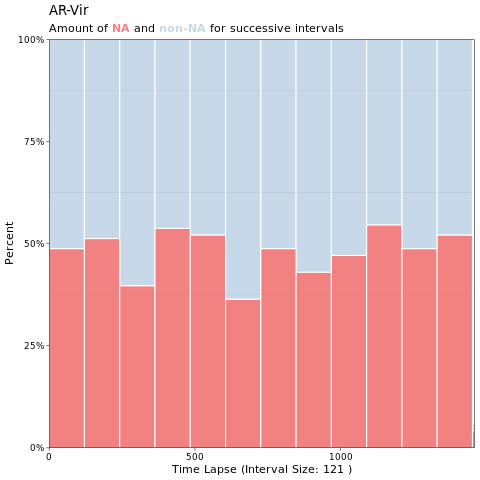

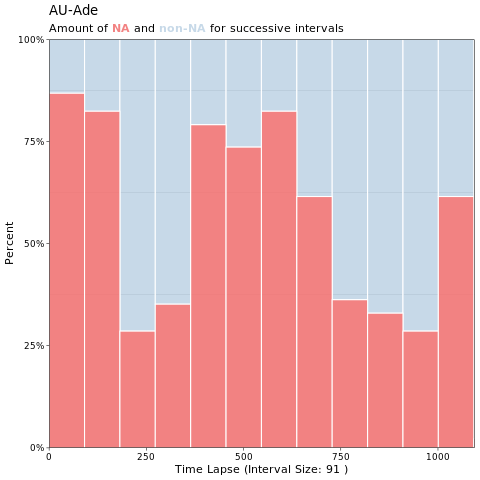

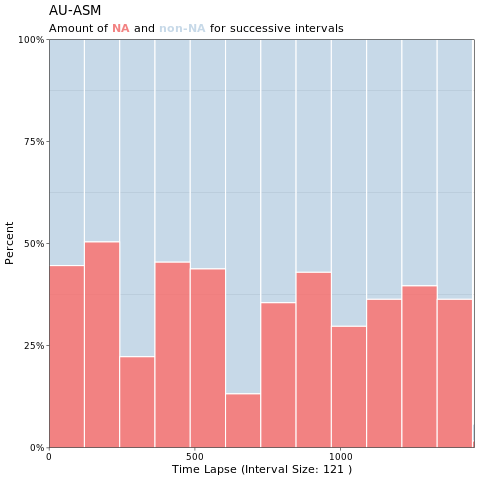

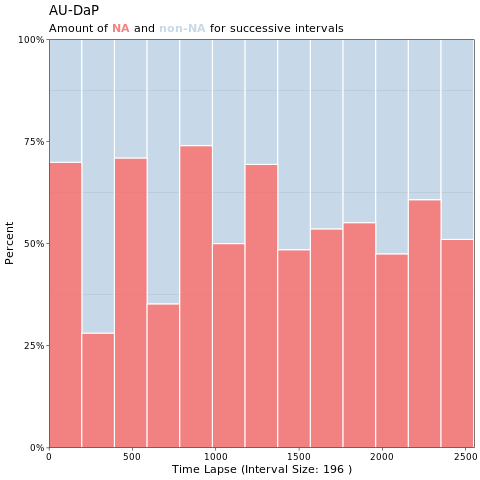

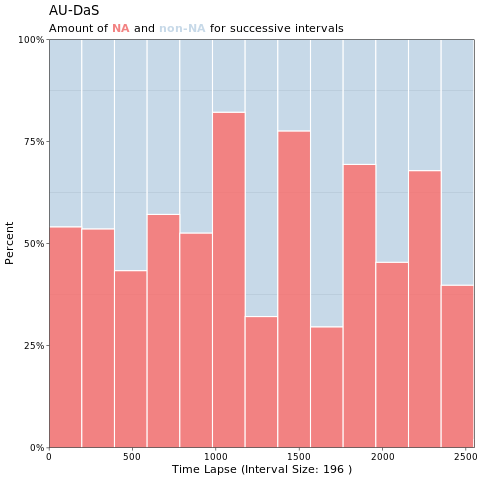

...

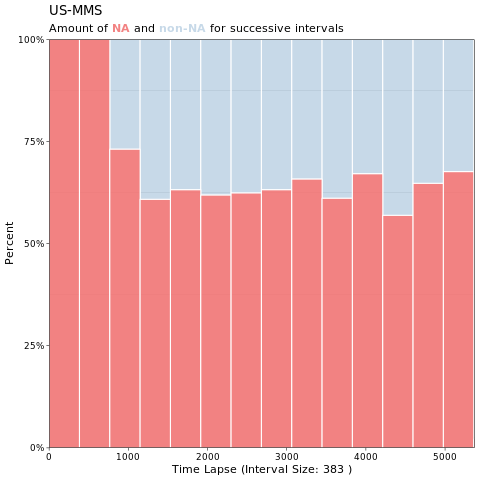

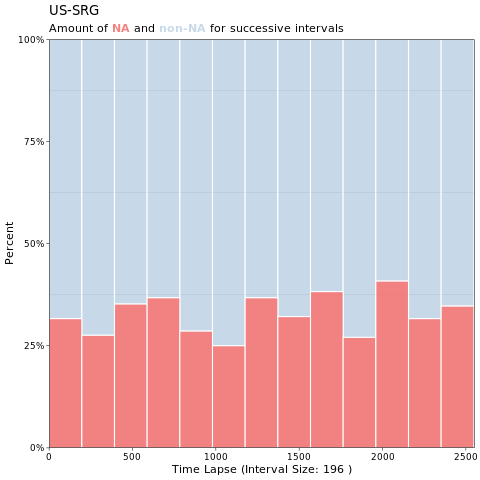

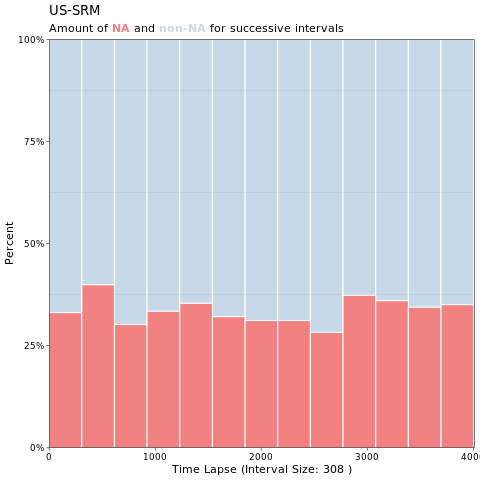

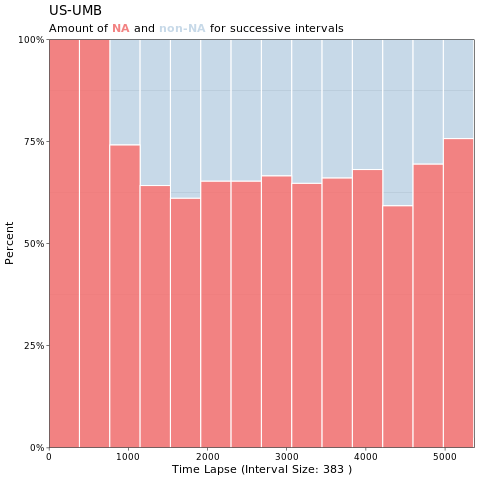

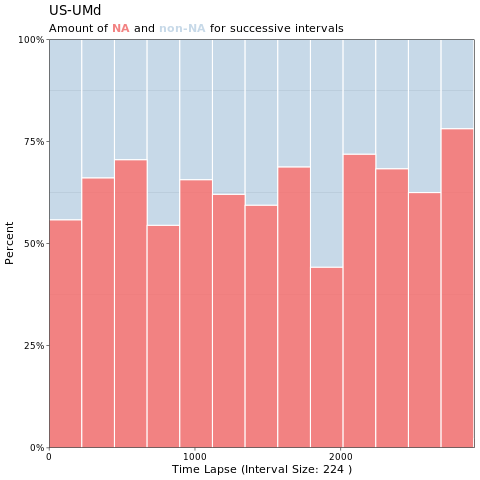

In [7]:
%%R 
# Plot missing data
## Visualize Distribution of missing values for df_lst
## Select specific site
sites <- ddf$site %>% unique()
n <- ceiling(sqrt(length(sites)))
par(mfrow=c(n,n)) # plotting area in a n*n array
for(site in sites){
    # print(site)
    df_site <- ddf[ddf$site ==site, ]
    df_lst <- df_site %>% 
        select(lst_aqua)
    print(ggplot_na_intervals(df_lst, title = site))
    # !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!! TODO: WHY ONLY ABOUT 100 - 700 ENTRIES PER SITE? !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    # !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!! Deleted entries should be NA not gone. maybe lost when merging? !!!!!!!!!!!!!!!!!!!!!!! 
    # !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!! Compare to raw data -> compare after merging. find where the rows are lost
}

#### Data without a Trend and without Seasonality
For data without a trend and without seasonality the mean, median, mode, or a random sample imputation could be used. However this is not the case here. As environmental data the temperature as well as the reflectance data have a seasonality and due to climate change there could also be a trend. However the timeframe is not that large such that a general trend might be neglectible and there could be simplifications by calculating a seasonal mean, median, ...  
For small gaps the seasonality might be neglectable since the data is daily and seasonal differences as well as trends could be small. This should be looked at beforehand however.

##### Random Imputation
R
- `library(imputeTS)`
- `na.random(mydata)`

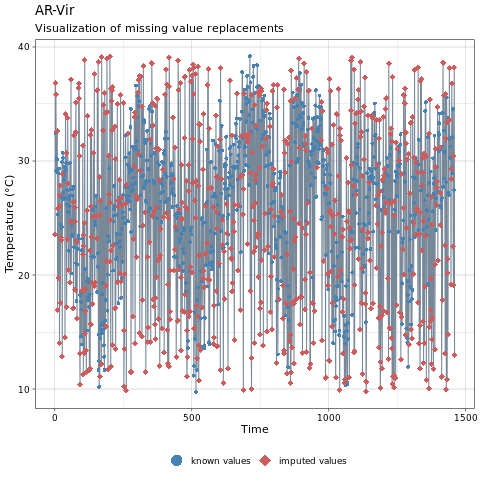

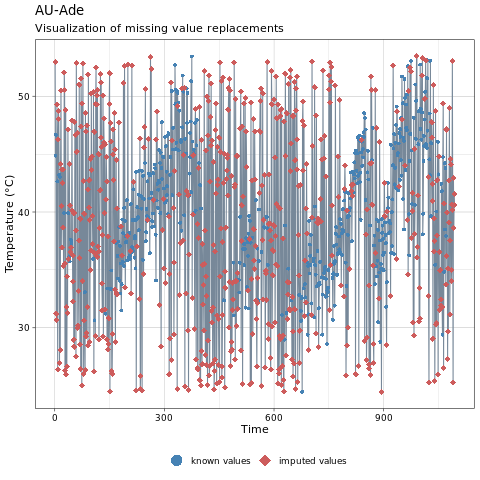

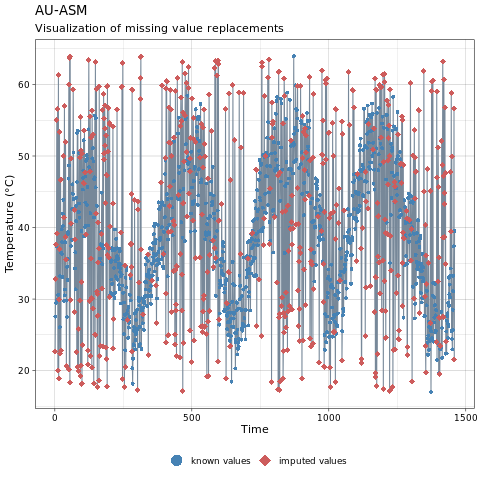

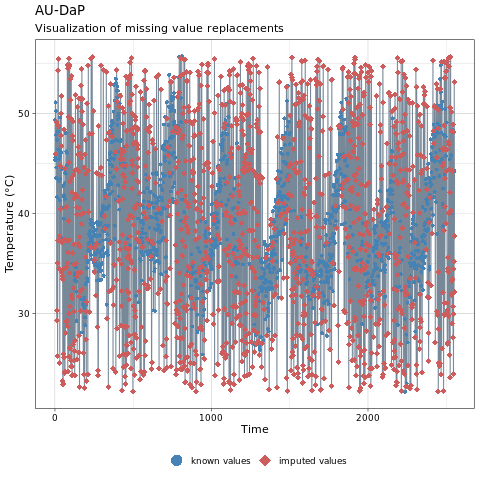

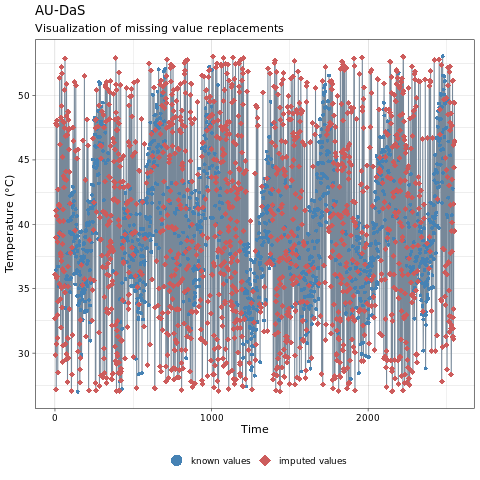

...

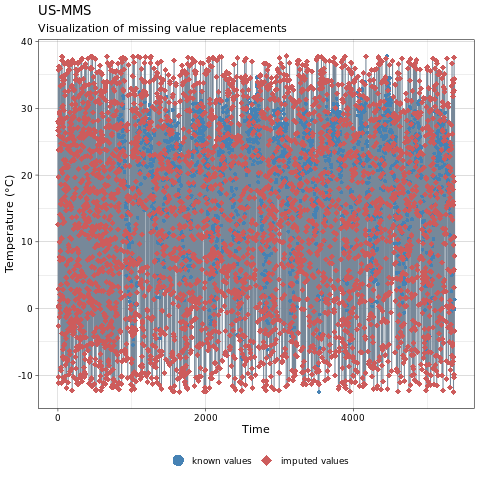

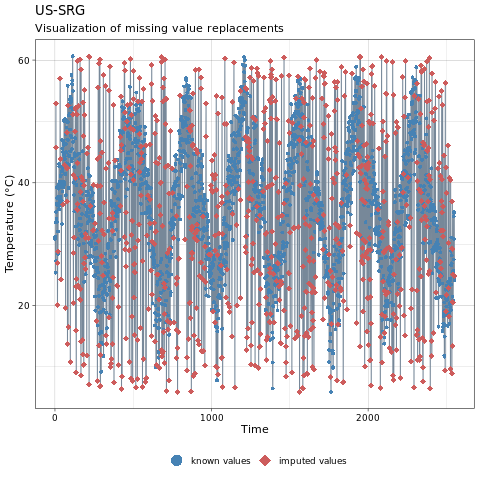

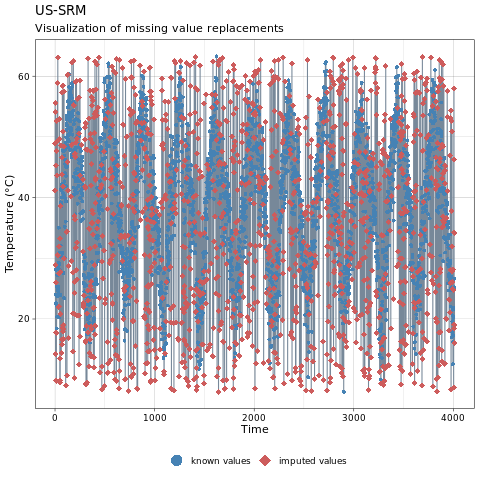

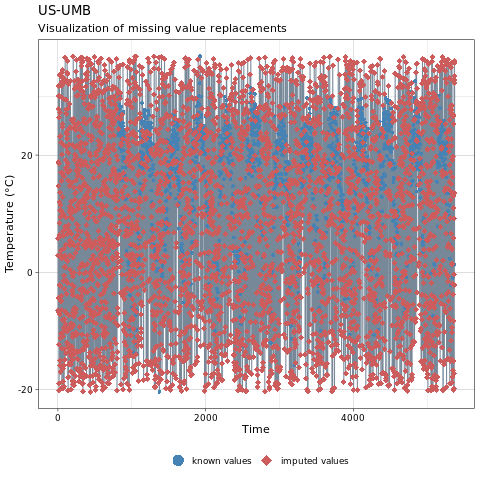

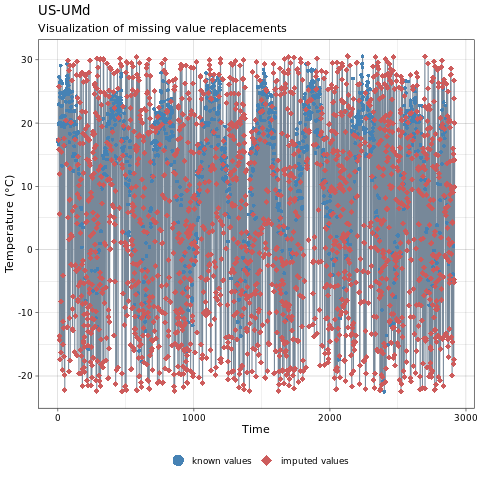

In [9]:
%%R
# Random Imputation
# !!!!!!!!!!!!!!!!!! TODO !!!!!!!!!!!!!!!!!!!!!!!!!!! 
# write function: return data, in a table with date, site lst, check if as.Date improves things...
# for(i in 1:ncol(data1)) {       # for-loop over columns
#   data1[ , i] <- data1[ , i] + 10
# }
printing <- "print_imputations"
# printing <- "summary_mydata_filled"
data = ddf %>% 
        select(date, site, lst_aqua)
for(site in sites){
    mydata_site = ddf[ddf$site == site, ]
    mydata <- mydata_site %>% 
        select(lst_aqua)
    mydata_random = na.random(mydata)
    printing_missing_data(printing, mydata, mydata_random, name = site)
    mydata_random$date <- mydata_site$date
    mydata_random$site <- site
    if (exists('df_filled') && is.data.frame(get('df_filled'))){
        df_filled <- rbind(df_filled, mydata_random)
    } else {
        df_filled <- mydata_random
    }
}


##### Last Observation Carried Forward (LOCF)
Performs badly if there was a visable trend and introduce a bias.

R
- `library(imputeTS)`
- `na.locf(mydata, option = "locf")`

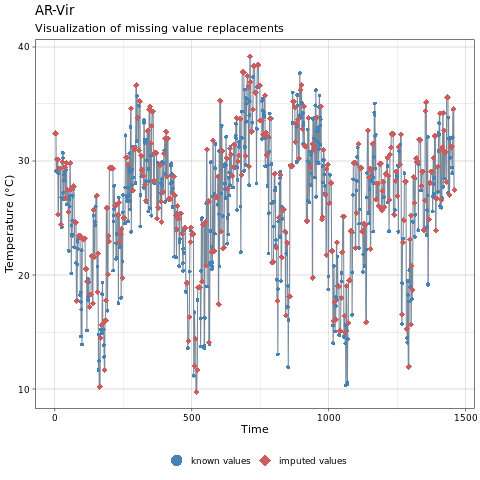

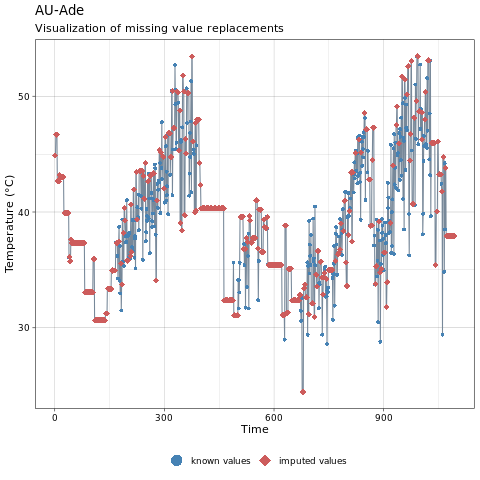

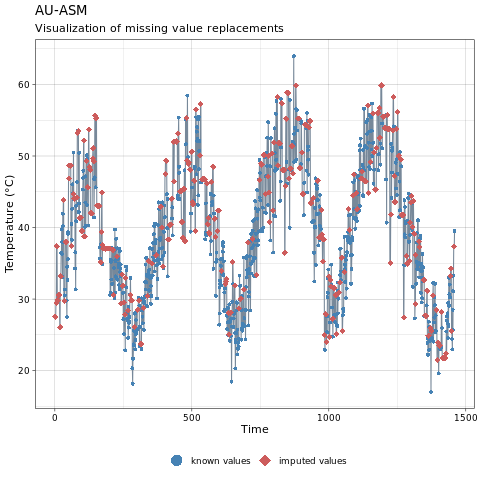

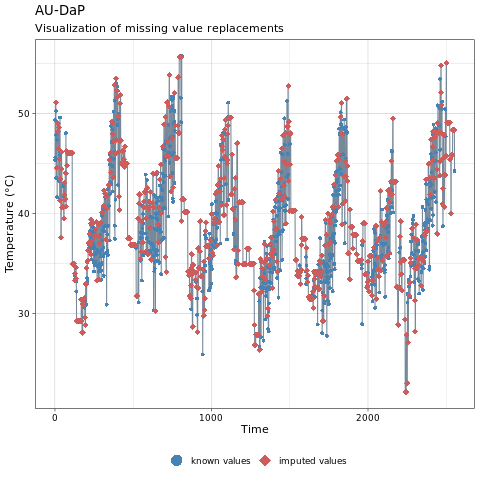

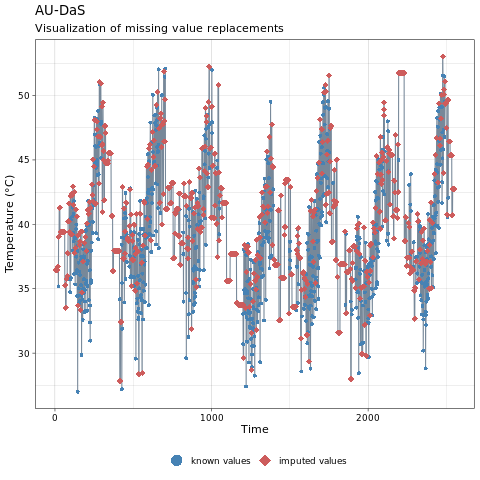

...

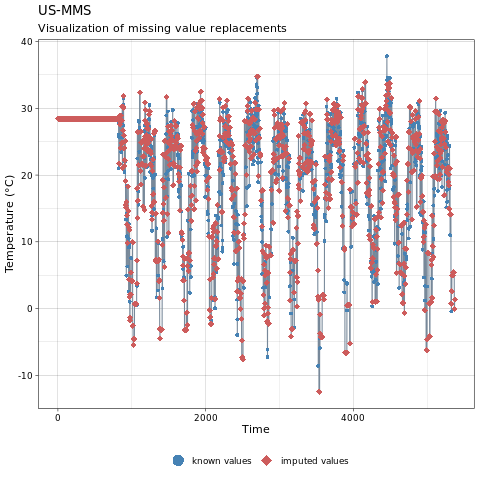

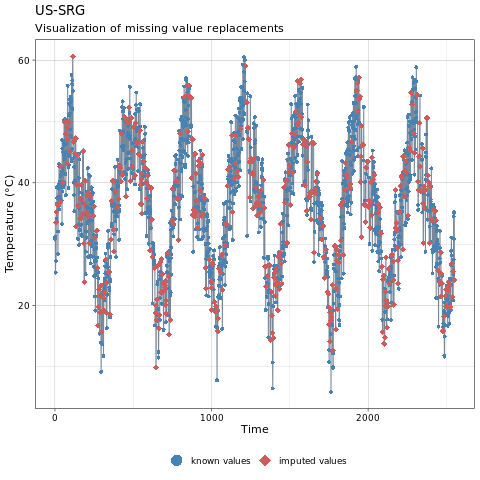

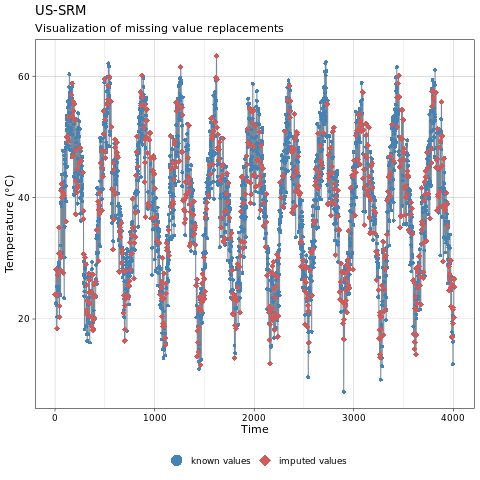

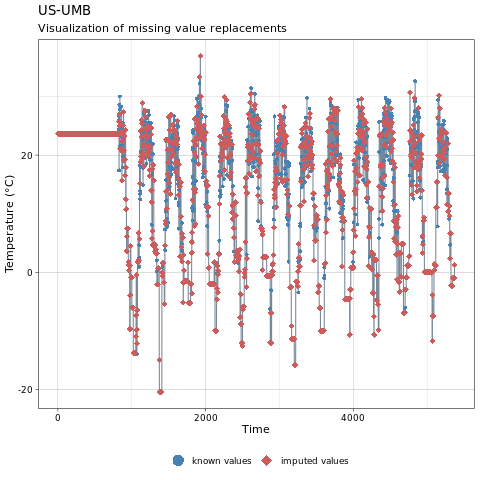

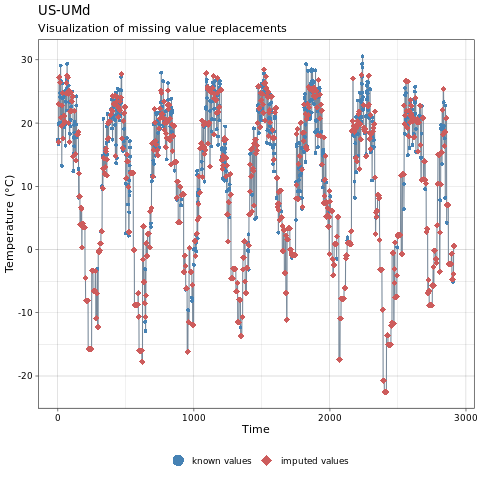

In [10]:
%%R
printing <- "print_imputations"
# printing <- "summary_mydata_filled"
data = ddf %>% 
        select(date, site, lst_aqua)
for(site in sites){
    mydata_site = ddf[ddf$site == site, ]
    mydata <- mydata_site %>% 
        select( lst_aqua)
    mydata_locf <- na.locf(mydata, option = "locf")
    # print the imputed values
    printing_missing_data(printing, mydata, mydata_locf, site)
    mydata_locf$date <- mydata_site$date
    mydata_locf$site <- site
    if (exists('df_filled') && is.data.frame(get('df_filled'))){
        df_filled <- rbind(df_filled, mydata_locf)
    } else {
        df_filled <- mydata_locf
    }
}

##### Next Observation Carried Backwards (NOCB)
Performs badly if there was a visable trend and introduce a bias.

R
- `library(imputeTS)`
- `na.locf(mydata, option = "nocb")`

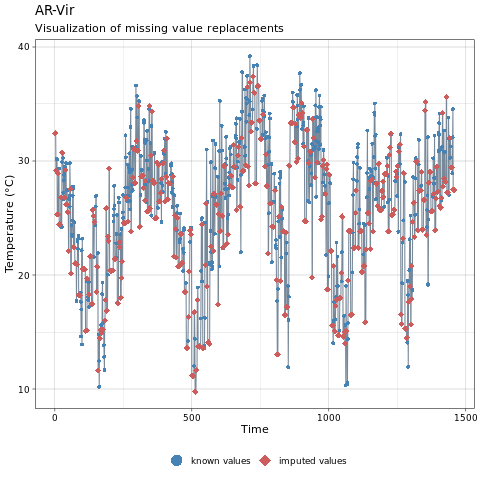

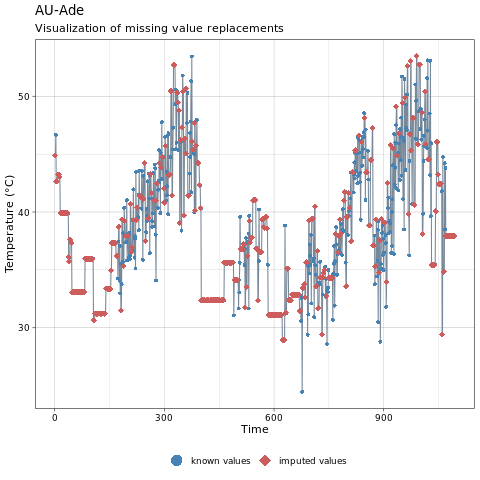

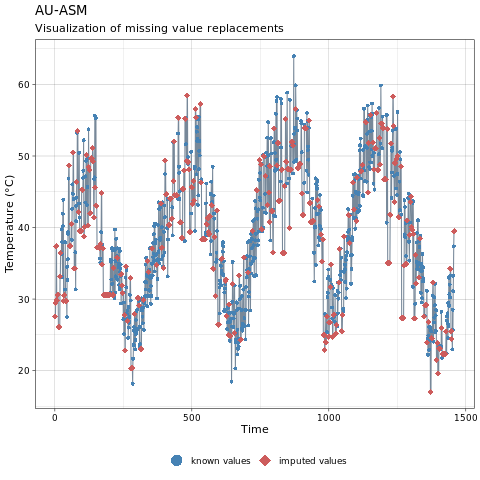

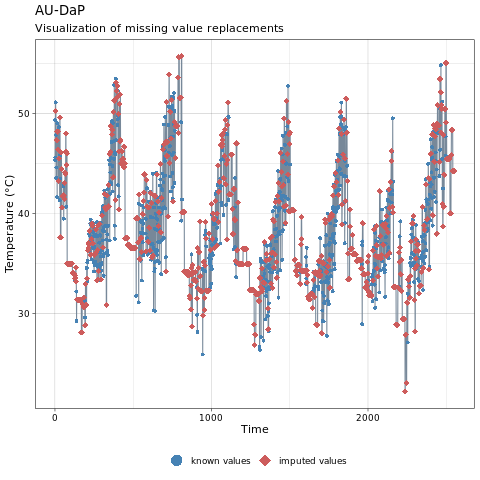

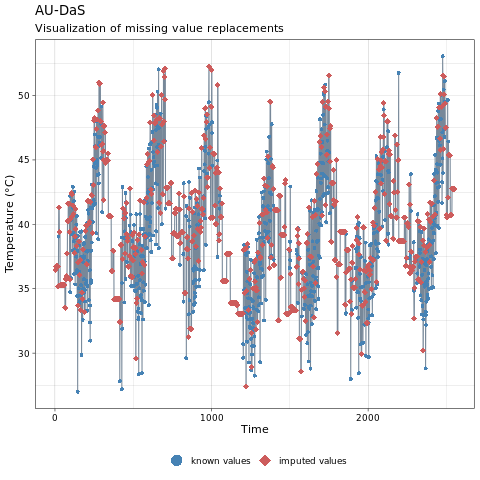

...

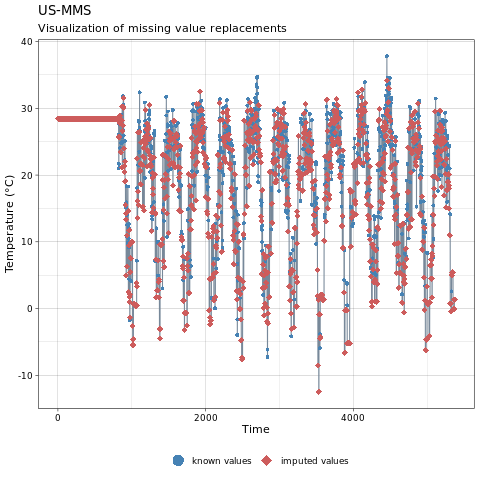

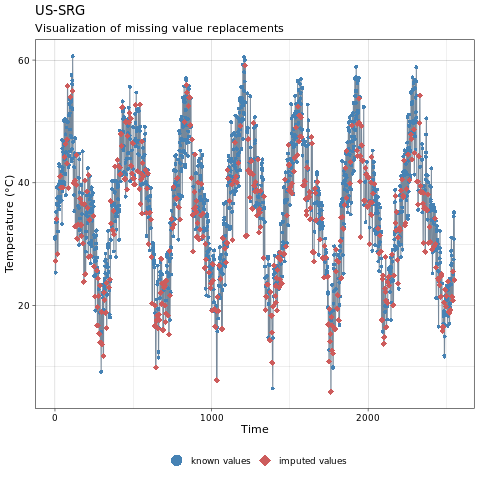

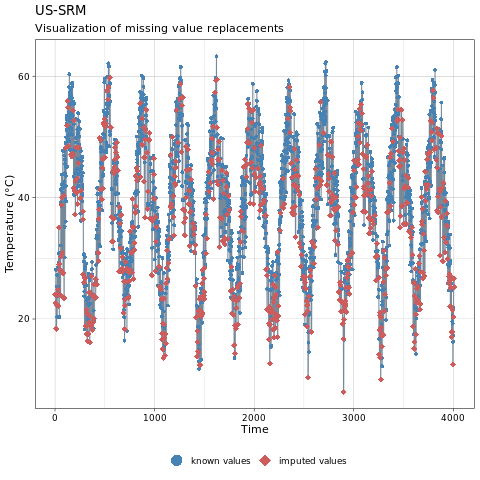

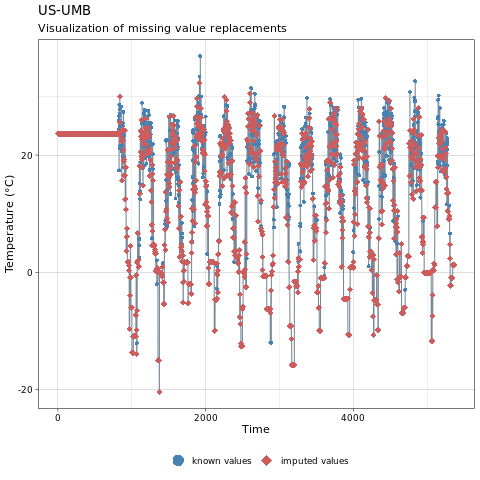

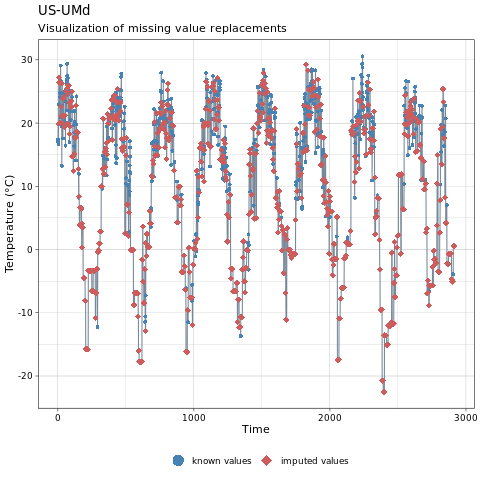

In [11]:
%%R

printing <- "print_imputations"
# printing <- "summary_mydata_filled"
data = ddf %>% 
        select(date, site, lst_aqua)
for(site in sites){
    mydata_site = ddf[ddf$site == site, ]
    mydata <- mydata_site %>% 
        select( lst_aqua)
    mydata_nocb <- na.locf(mydata, option = "nocb")
    # print the imputed values
    printing_missing_data(printing, mydata, mydata_nocb, site)
    mydata_nocb$date <- mydata_site$date
    mydata_nocb$site <- site
    if (exists('df_filled') && is.data.frame(get('df_filled'))){
        df_filled <- rbind(df_filled, mydata_nocb)
    } else {
        df_filled <- mydata_nocb
    }
}

#### Data with Trend and without Seasonality

For small gaps the seasonality might be neglectable since the data is daily. 

##### Linear Interpolation
R
- `library(imputeTS)`
- `na.interpolation(mydata)`


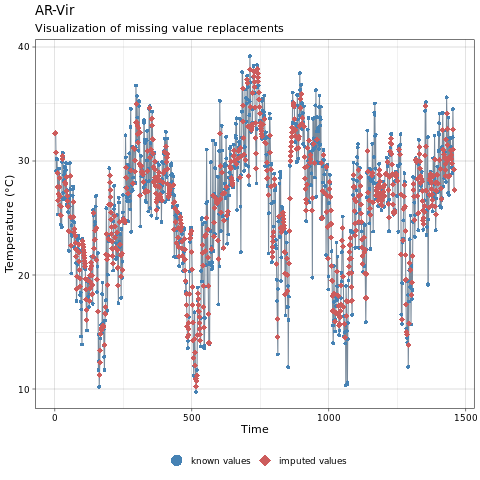

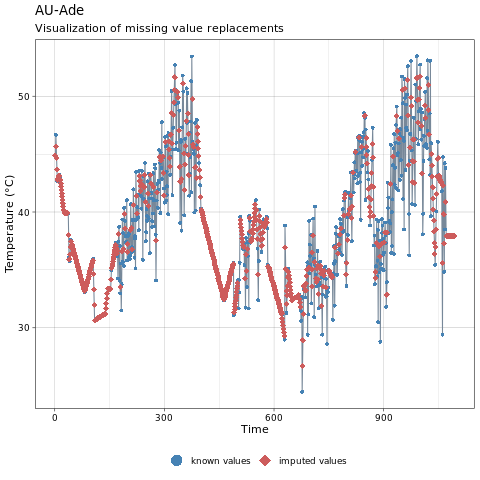

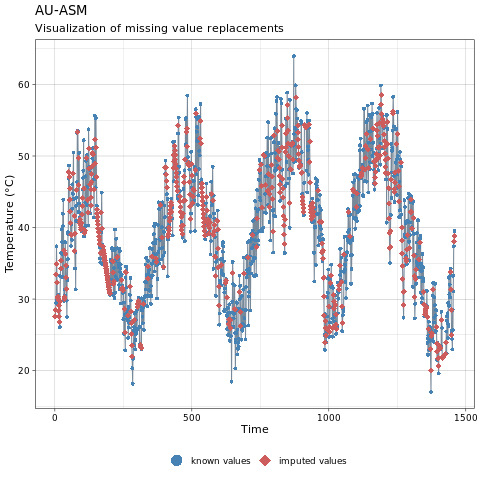

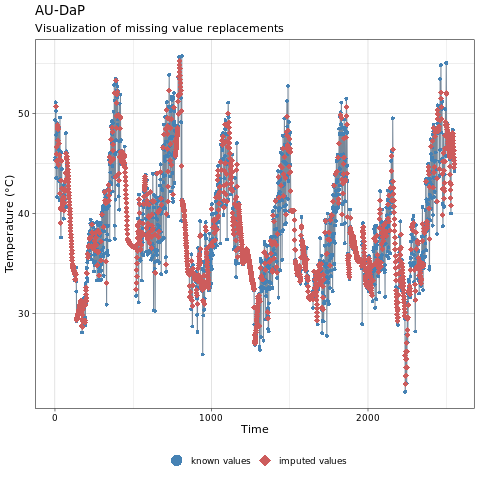

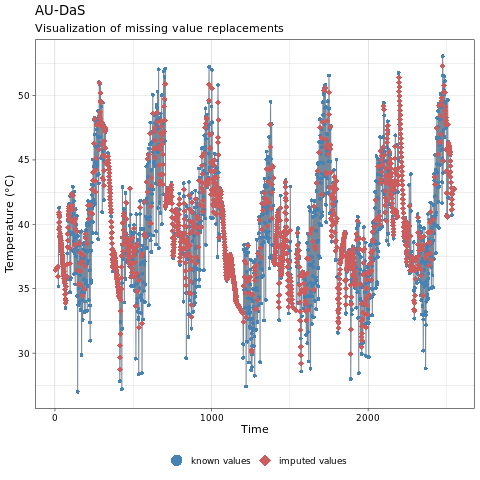

...

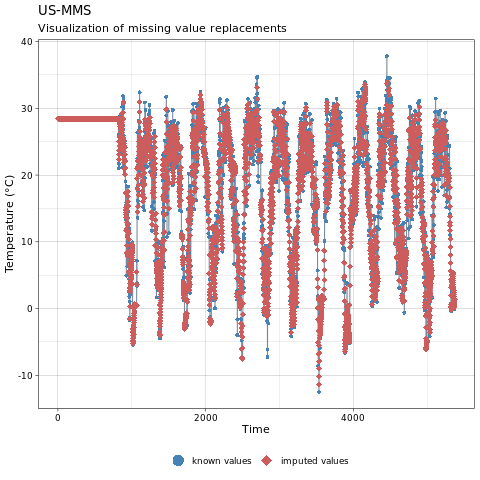

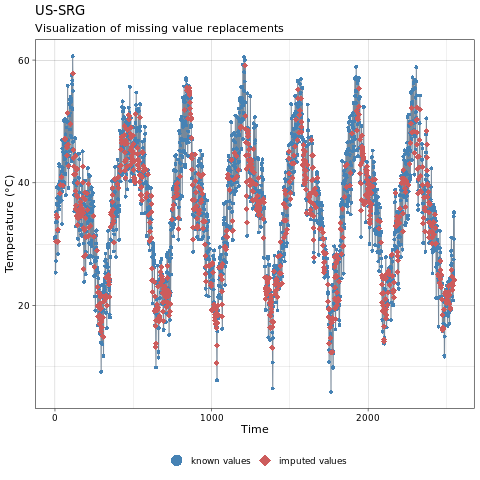

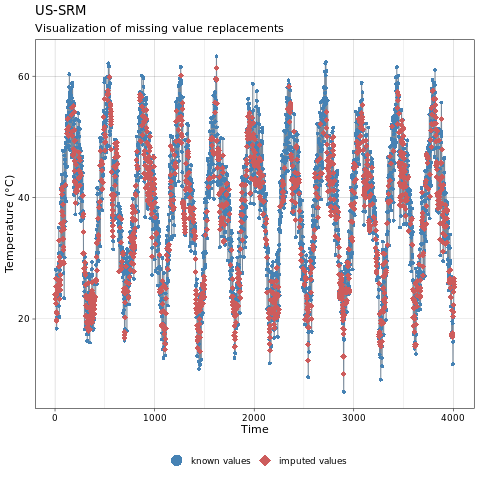

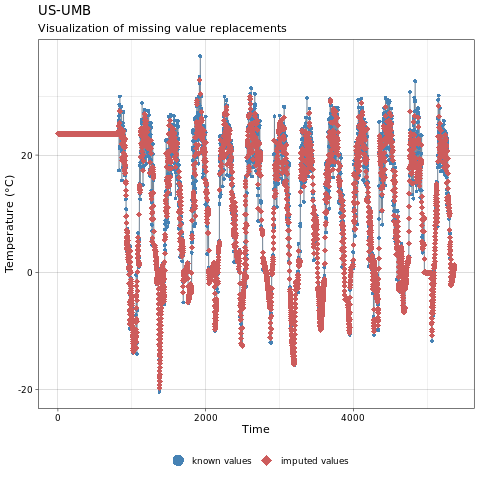

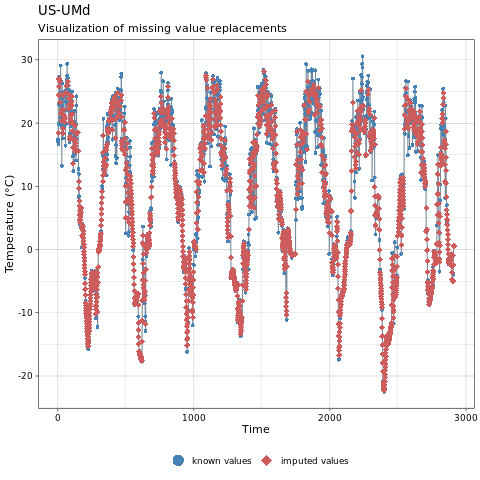

In [18]:
%%R
printing <- "print_imputations"
# printing <- "summary_mydata_filled"
data = ddf %>% 
        select(date, site, lst_aqua)
for(site in sites){
    mydata_site = ddf[ddf$site == site, ]
    mydata <- mydata_site %>% 
        select( lst_aqua)
    mydata_interpolation <- na.interpolation(mydata)
    # print the imputed values
    printing_missing_data(printing, mydata, mydata_interpolation, site)
    mydata_interpolation$date <- mydata_site$date
    mydata_interpolation$site <- site
    if (exists('df_filled') && is.data.frame(get('df_filled'))){
        df_filled <- rbind(df_filled, mydata_interpolation)
    } else {
        df_filled <- mydata_interpolation
    }
}
df_filled_interpollation <- df_filled

#### Data with Trend and Seasonality

##### Seasonal Adjustment and Interpolation 
R
- `library(imputeTS)`
- `na.seadec(mydata, algorithm = "interpolation")`

In [13]:
%%R
# !!!!!!!!!!!!!!!!!!!!!!! TODO: fix timestamp !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
# !!!!!!!!!!!!!!!!!!!!!!!       https://stat.ethz.ch/R-manual/R-devel/library/stats/html/ts.html
printing <- "print_imputations"
# printing <- "summary_mydata_filled"
data = ddf %>% 
        select(date, site, lst_aqua)
for(site in sites){
    mydata_site = ddf[ddf$site == site, ]
    mydata <- mydata_site %>% 
        select(date, lst_aqua)
    mydata_interpol_season_trend <- na.seadec(mydata)
    # print the imputed values
    printing_missing_data(printing, mydata, mydata_interpol_season_trend, site)
    mydata_interpol_season_trend$date <- mydata_site$date
    mydata_interpol_season_trend$site <- site
    if (exists('df_filled') && is.data.frame(get('df_filled'))){
        df_filled <- rbind(df_filled, mydata_interpol_season_trend)
    } else {
        df_filled <- mydata_interpol_season_trend
    }
}
 # since mydata doesn't contain a timestamp there cant be that much inclusion of seasonality, trend is possible if it assumes just every entry one day later.
# on first glance the trend seems neglectable. 

R[write to console]: Error in ggplot_na_imputations(mydata + offset, mydata_filled + offset,  : 
  x_with_na is not univariate.
    The function only works with univariate input for x_with_na.
    For data types with multiple variables/columns only input the
         column you want to plot as parameter x_with_na.

R[write to console]: In addition: 
R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 




Error in ggplot_na_imputations(mydata + offset, mydata_filled + offset,  : 
  x_with_na is not univariate.
    The function only works with univariate input for x_with_na.
    For data types with multiple variables/columns only input the
         column you want to plot as parameter x_with_na.


RInterpreterError: Failed to parse and evaluate line '# !!!!!!!!!!!!!!!!!!!!!!! TODO: fix timestamp !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!\n# !!!!!!!!!!!!!!!!!!!!!!!       https://stat.ethz.ch/R-manual/R-devel/library/stats/html/ts.html\nprinting <- "print_imputations"\n# printing <- "summary_mydata_filled"\ndata = ddf %>% \n        select(date, site, lst_aqua)\nfor(site in sites){\n    mydata_site = ddf[ddf$site == site, ]\n    mydata <- mydata_site %>% \n        select(date, lst_aqua)\n    mydata_interpol_season_trend <- na.seadec(mydata)\n    # print the imputed values\n    printing_missing_data(printing, mydata, mydata_interpol_season_trend, site)\n    mydata_interpol_season_trend$date <- mydata_site$date\n    mydata_interpol_season_trend$site <- site\n    if (exists(\'df_filled\') && is.data.frame(get(\'df_filled\'))){\n        df_filled <- rbind(df_filled, mydata_interpol_season_trend)\n    } else {\n        df_filled <- mydata_interpol_season_trend\n    }\n}\n # since mydata doesn\'t contain a timestamp there cant be that much inclusion of seasonality, trend is possible if it assumes just every entry one day later.\n# on first glance the trend seems neglectable. \n'.
R error message: 'Error in ggplot_na_imputations(mydata + offset, mydata_filled + offset,  : \n  x_with_na is not univariate.\n    The function only works with univariate input for x_with_na.\n    For data types with multiple variables/columns only input the\n         column you want to plot as parameter x_with_na.'

### General Problem

#### Categorical

##### Make NA as level

##### Multiple Imputation

##### Logistic Regression

##### K Nearest Neighbors (KNN)
k neighboors are chosen based on some distance measure and their average is used as an imputation estimate. This requires a selection of the number of nearest neighbors and a distance metric. For continuous data the commonlz used distance metrics are eucledian, Manhattan and Cosine. For Categorical Data the Hamming distance is usually used. 

##### XGBoost

##### Random Forest 
R
- `library(missForest) # could be skewed due to inter-relationships within the data`
- `library(CALIBERrfimpute) # can have more biases than predictive mean matching for logistic regression relationships with interacting`
https://bmcmedresmethodol.biomedcentral.com/articles/10.1186/s12874-020-01080-1

#### Continuous

##### Mean
R
- `library(imputeTS)`
- `na.mean(mydata, option = "mean")`


Python
- `from sklearn.preprocessing import Imputer`
- `values = mydata.values`
- `imputer = Imputer(missing_values = 'NaN, strategy = 'mean')`
- `transformed_values = imputer.fit_transform(values)`

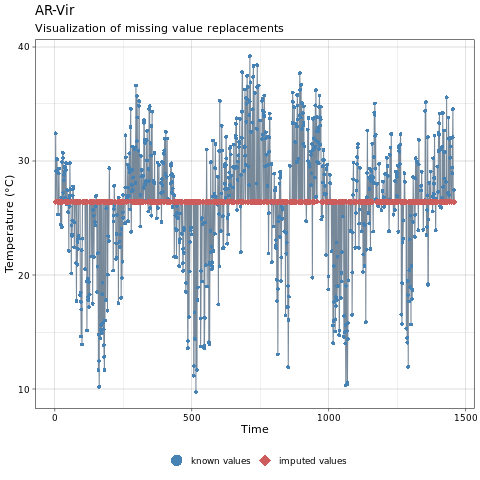

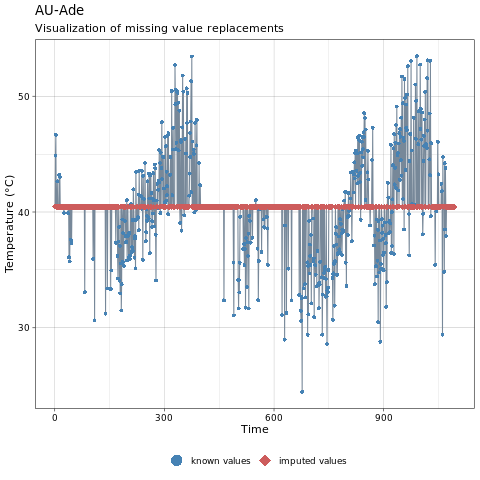

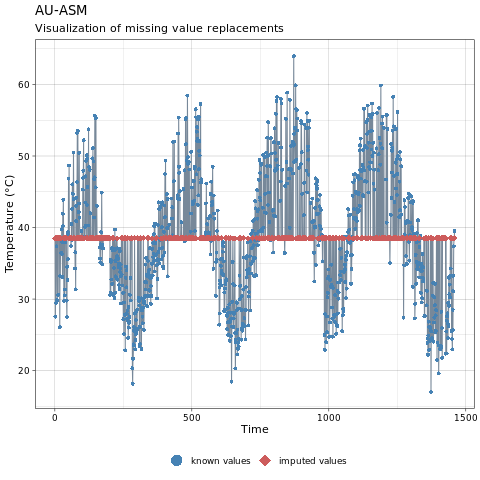

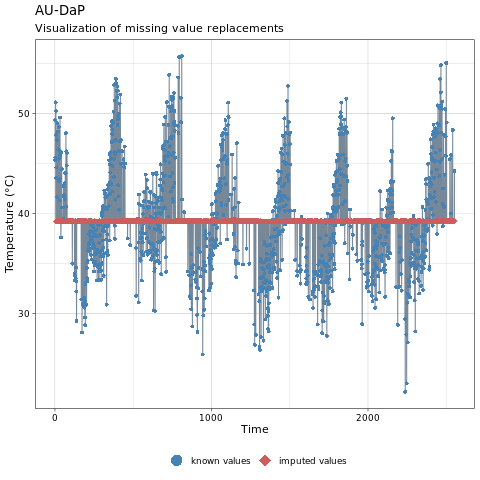

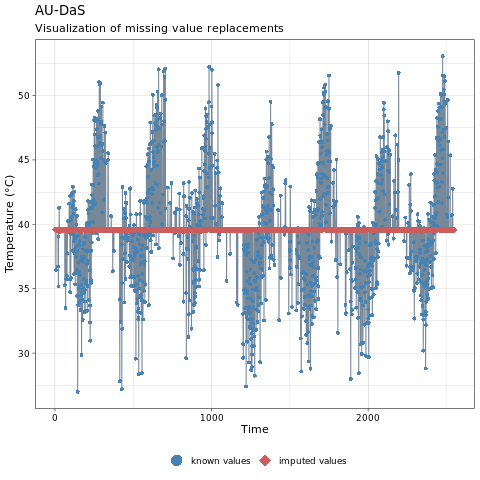

...

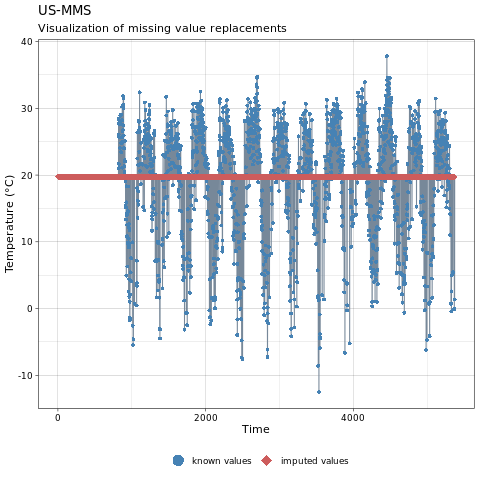

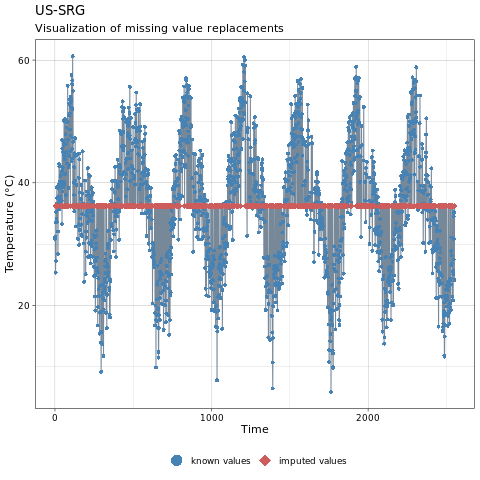

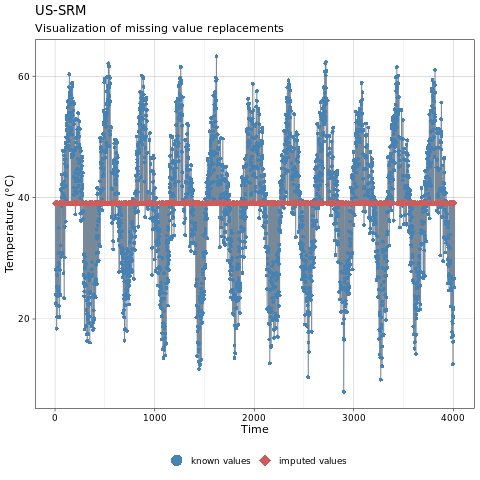

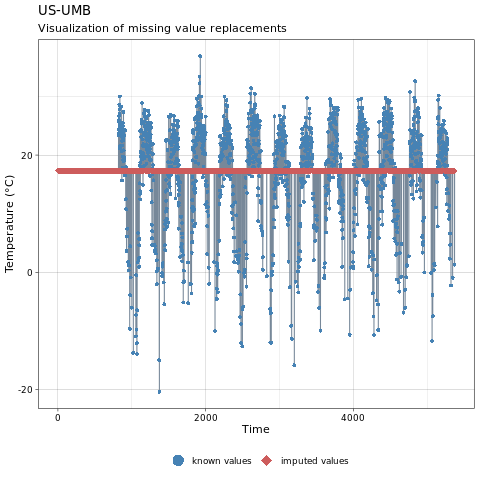

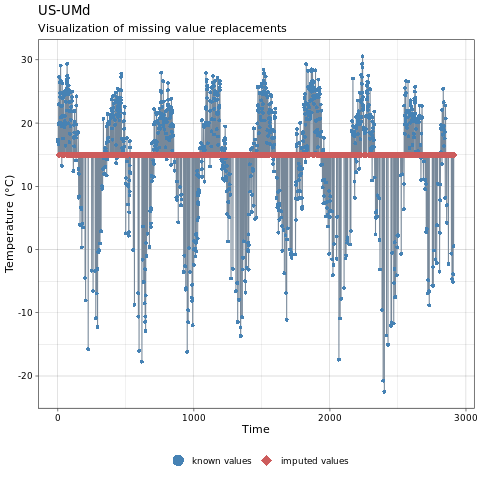

In [14]:
%%R
printing <- "print_imputations"
# printing <- "summary_mydata_filled"
data = ddf %>% 
        select(date, site, lst_aqua)
for(site in sites){
    mydata_site = ddf[ddf$site == site, ]
    mydata <- mydata_site %>% 
        select( lst_aqua)
    mydata_mean <- na.mean(mydata, option = "mean")
    # print the imputed values
    printing_missing_data(printing, mydata, mydata_mean, site, offset = -273.15, y_axis = "Temperature (\u00B0C)")
    mydata_mean$date <- mydata_site$date
    mydata_mean$site <- site
    if (exists('df_filled') && is.data.frame(get('df_filled'))){
        df_filled <- rbind(df_filled, mydata_mean)
    } else {
        df_filled <- mydata_mean
    }
}

##### Median
R
- `library(imputeTS)`
- `na.mean(mydata, option = "median")`

Python
- `from sklearn.preprocessing import Imputer`
- `values = mydata.values`
- `imputer = Imputer(missing_values = 'NaN, strategy = 'median')`
- `transformed_values = imputer.fit_transform(values)`


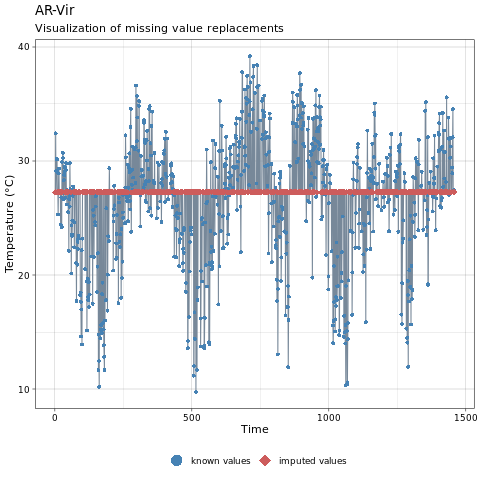

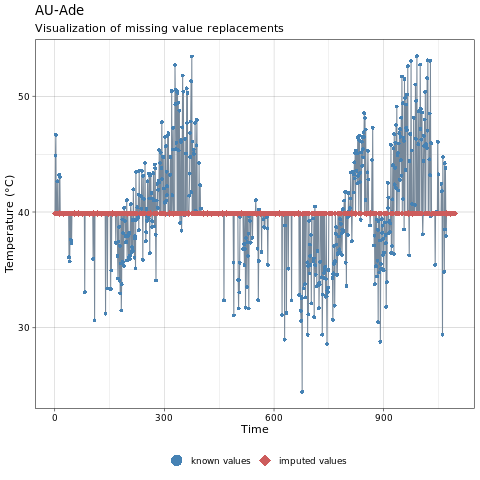

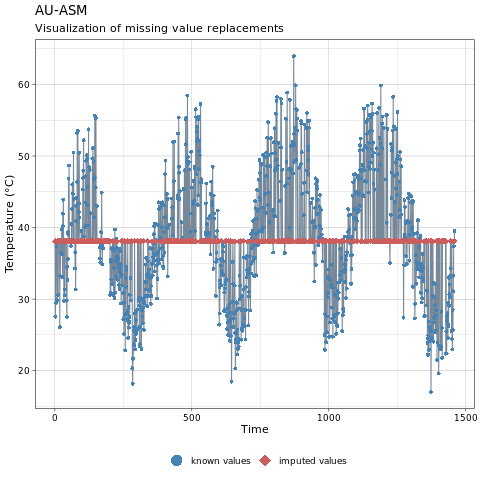

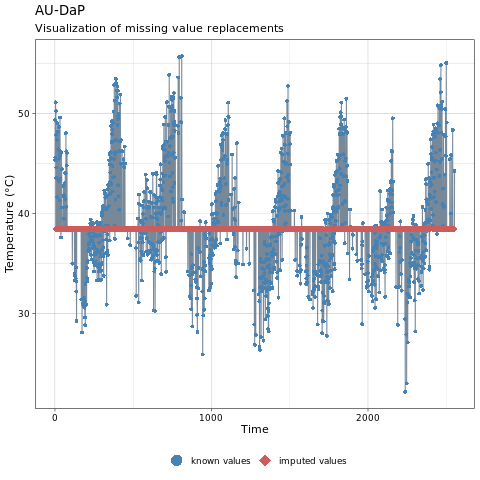

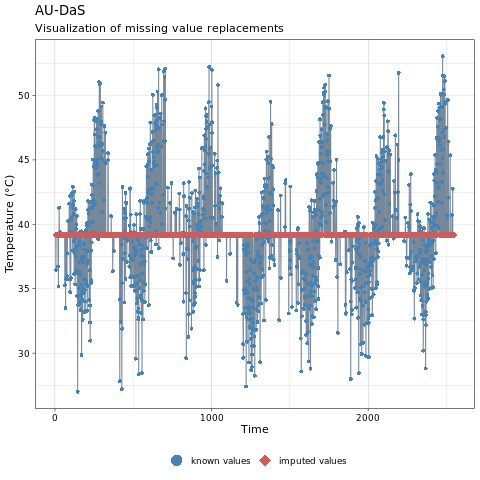

...

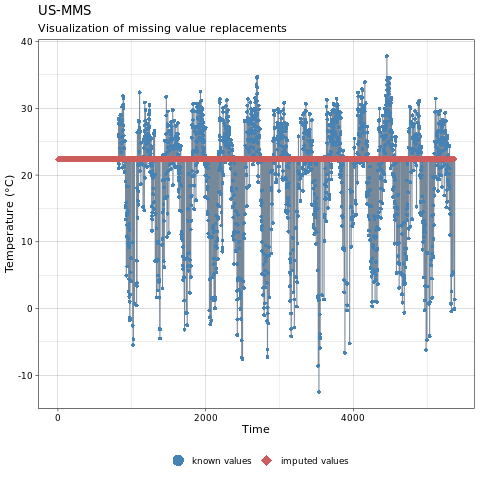

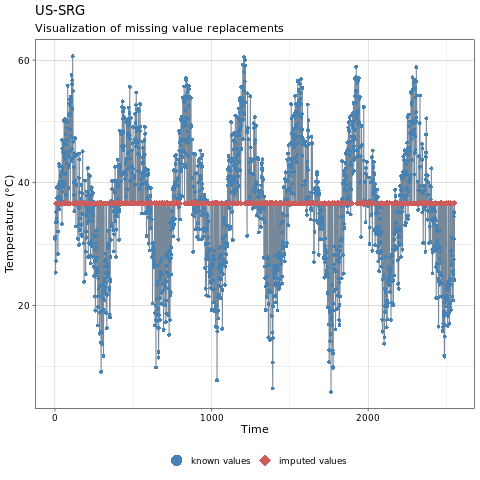

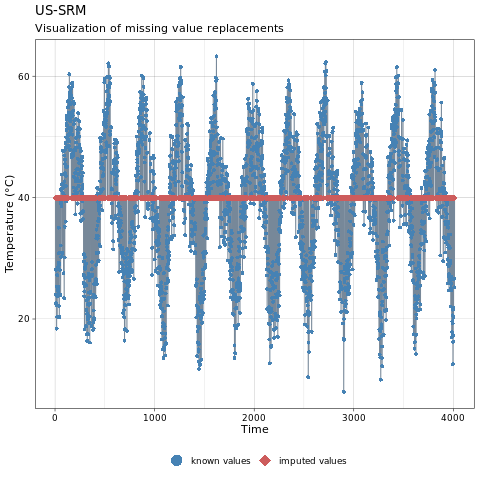

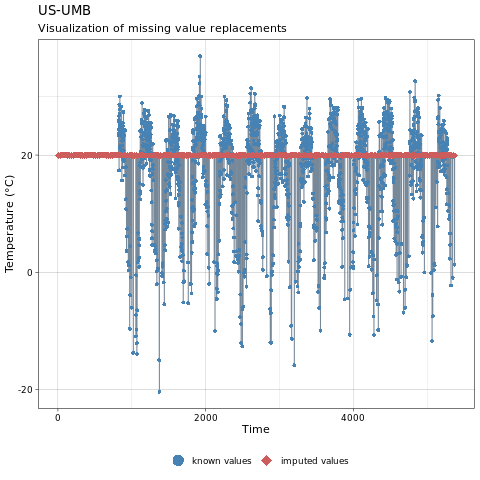

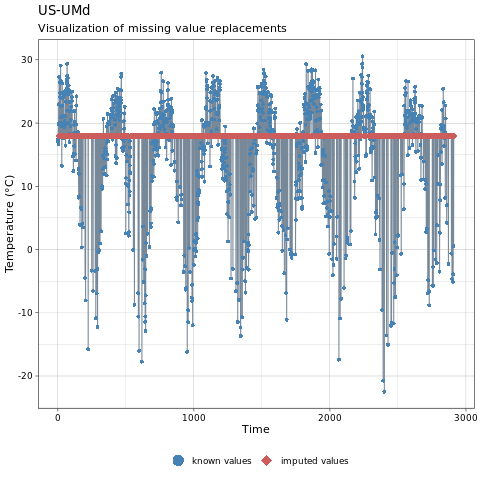

In [15]:
%%R
printing <- "print_imputations"
# printing <- "summary_mydata_filled"
data = ddf %>% 
        select(date, site, lst_aqua)
for(site in sites){
    mydata_site = ddf[ddf$site == site, ]
    mydata <- mydata_site %>% 
        select( lst_aqua)
    mydata_median <-na.mean(mydata, option = "median")
    # print the imputed values
    printing_missing_data(printing, mydata, mydata_median, site, offset = -273.15, y_axis = "Temperature (\u00B0C)")
    mydata_median$date <- mydata_site$date
    mydata_median$site <- site
    if (exists('df_filled') && is.data.frame(get('df_filled'))){
        df_filled <- rbind(df_filled, mydata_median)
    } else {
        df_filled <- mydata_median
    }
}

##### Mode
R
- `library(imputeTS)`
- `na.mean(mydata, option = "mode")`

Python
- `from sklearn.preprocessing import Imputer`
- `values = mydata.values`
- `imputer = Imputer(missing_values = 'NaN, strategy = 'most_frequent')`
- `transformed_values = imputer.fit_transform(values)`

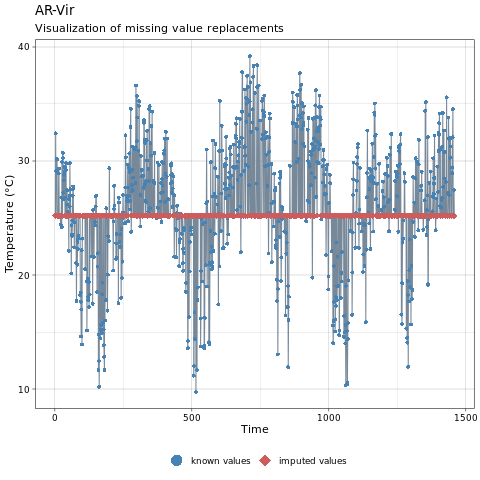

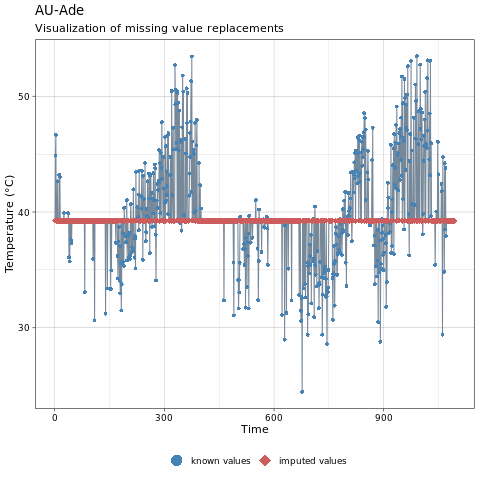

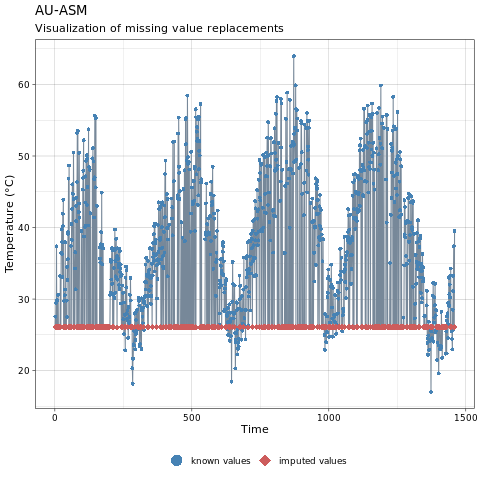

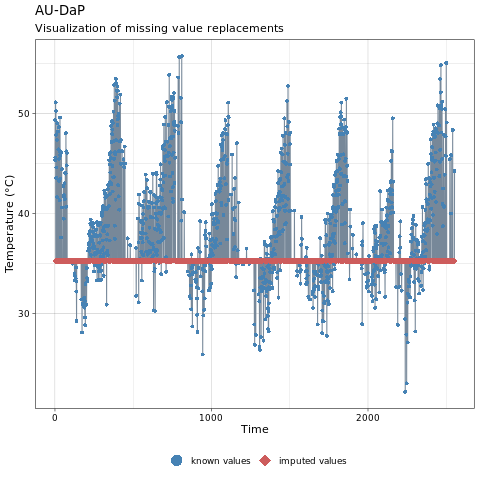

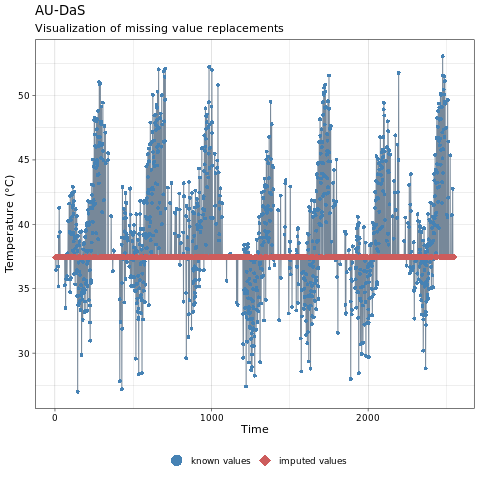

...

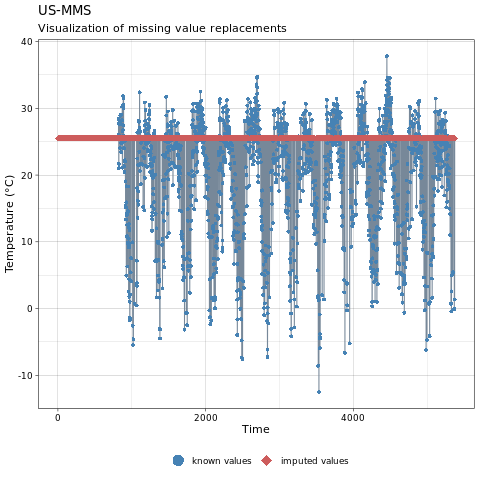

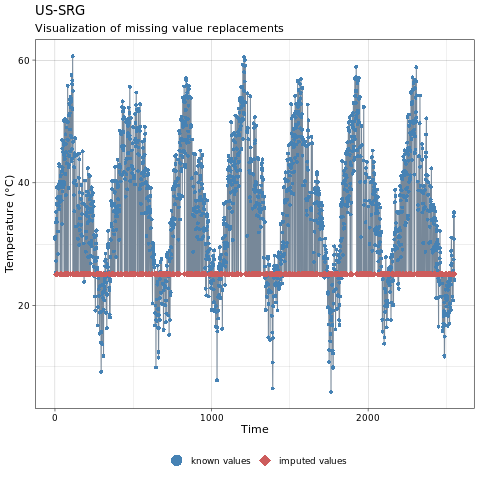

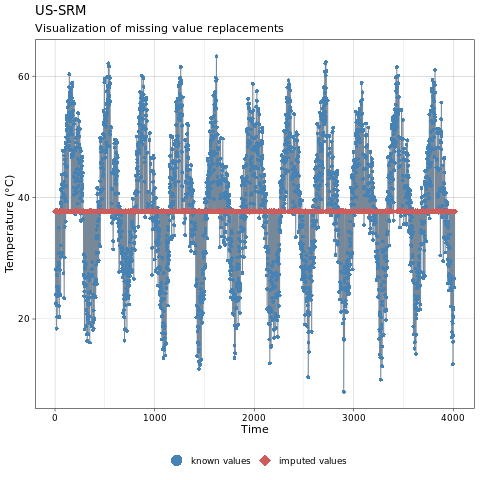

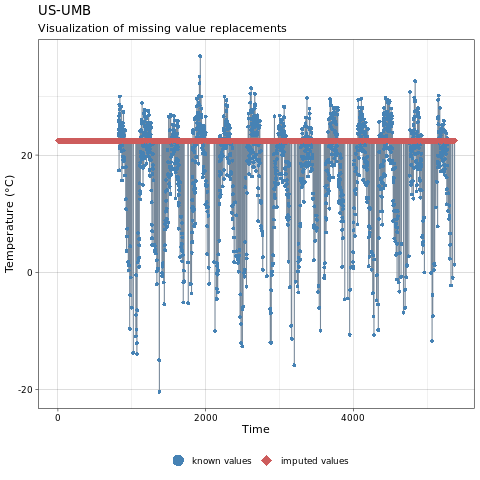

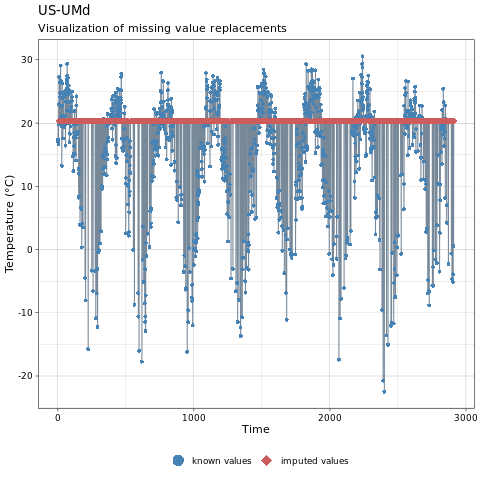

In [16]:
%%R
# performs rather badly, both mean and median are better suited
printing <- "print_imputations"
# printing <- "summary_mydata_filled"
data = ddf %>% 
        select(date, site, lst_aqua)
for(site in sites){
    mydata_site = ddf[ddf$site == site, ]
    mydata <- mydata_site %>% 
        select( lst_aqua)
    mydata_mode <-na.mean(mydata, option = "mode")
    # print the imputed values
    printing_missing_data(printing, mydata, mydata_mode, site, offset = -273.15, y_axis = "Temperature (\u00B0C)")
    mydata_mode$date <- mydata_site$date
    mydata_mode$site <- site
    if (exists('df_filled') && is.data.frame(get('df_filled'))){
        df_filled <- rbind(df_filled, mydata_mode)
    } else {
        df_filled <- mydata_mode
    }
}

##### Moving average 
R
- `library(imputeTS)`
- `na_ma(x, k = 4, weighting = "exponential", maxgap = Inf)`

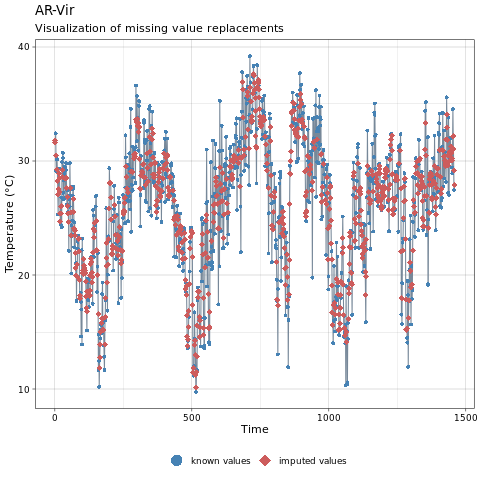

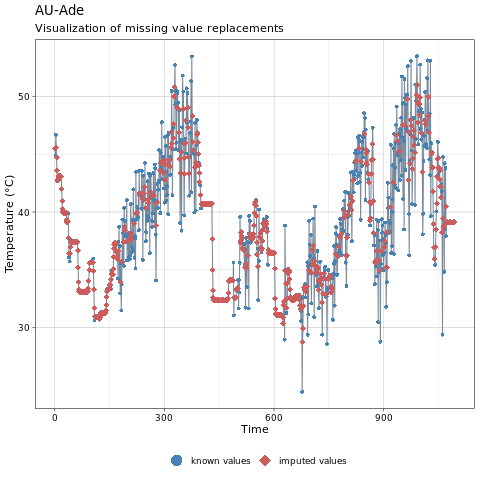

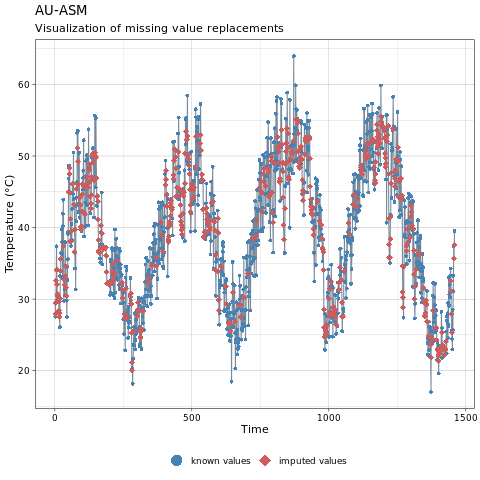

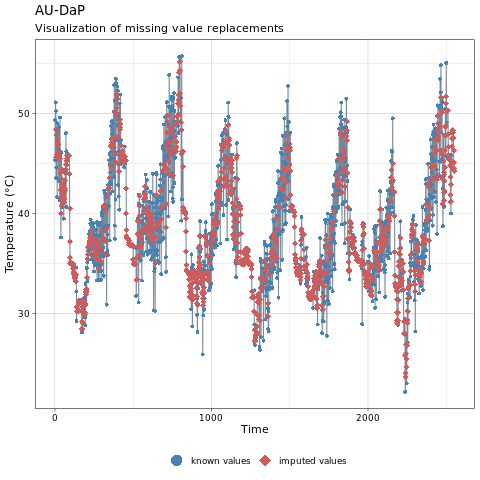

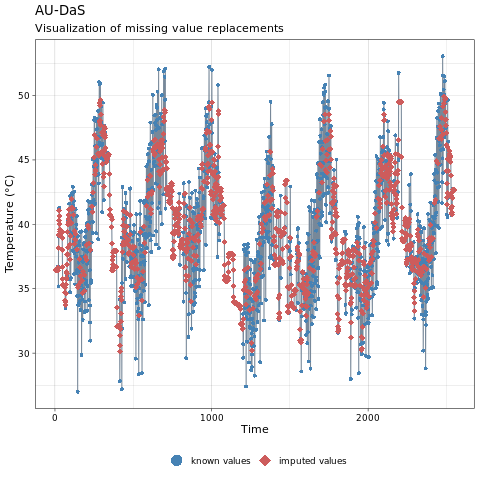

...

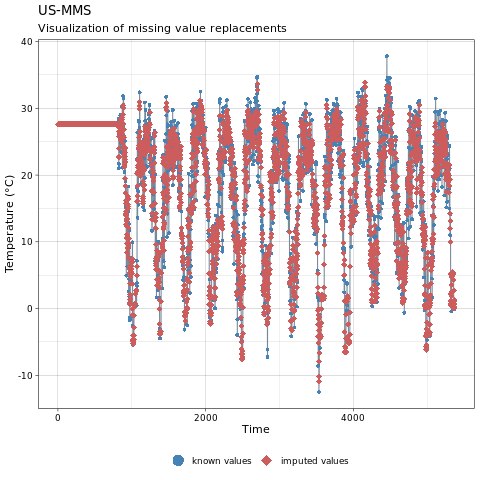

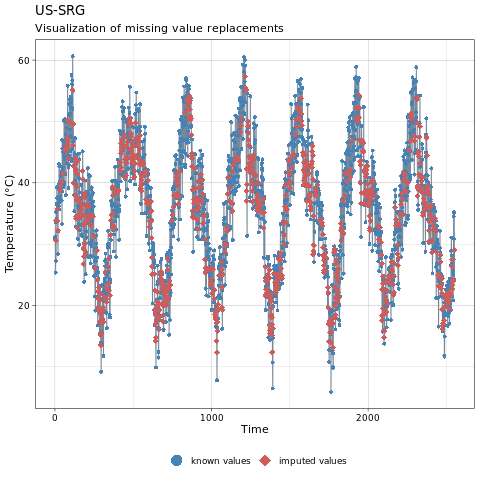

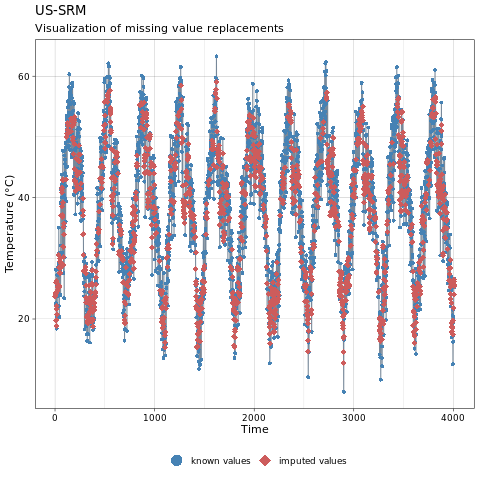

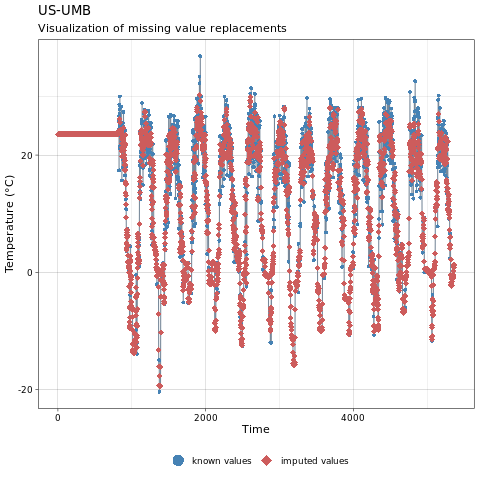

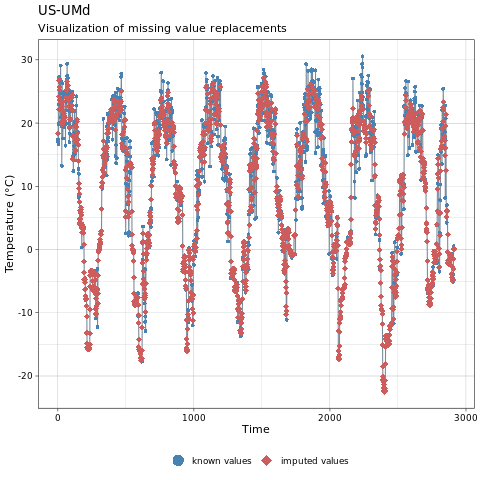

In [17]:
%%R
# Bad after a drastic change. Could be cancled out by using a moving average of data from several years combined.
printing <- "print_imputations"
weight <- "exponential" # linear, simple are also options
x_days <- 4 # number of days, if the gap is smaller it automatically increases until there are at least two elements
# printing <- "summary_mydata_filled"
df_filled = 0
# !!!!!!!!!!!!!!!!!!! TODO: Check if all the data is really continuous !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
data = ddf %>% 
        select(date, site, lst_aqua)
for(site in sites){
    mydata_site = ddf[ddf$site == site, ]
    mydata <- mydata_site %>% 
        select( lst_aqua)
    mydata_moving_average <-na_ma(mydata, k = x_days, weighting = weight, maxgap = Inf)
    # print the imputed values
    printing_missing_data(printing, mydata, mydata_moving_average, site, offset = -273.15, y_axis = "Temperature (\u00B0C)")
    mydata_moving_average$date <- mydata_site$date
    mydata_moving_average$site <- site
    if (exists('df_filled') && is.data.frame(get('df_filled'))){
        df_filled <- rbind(df_filled, mydata_moving_average)
    } else {
        df_filled <- mydata_moving_average
    }
}

##### Multiple Imputation
Impute the missing entries several times, analyse each dataset and chose one of them.
No bias if imputation model is correct and known. This won't be used here to handle missing data and is just mentioned as an other way to handle missing data. 

R
- `library(mice)`
- `imp <- mice(mydata, method = "norm.predict", m = 1) # Deterministic regression imputation via mice`
- `data_imp <- complete(imp) # Store data`
- `imp <- mice(mydata, m = 5) # Multiple Imputation`
- `fit <- with(data = imp, lm(y ~ x + z)) # build predictive model`
- `icombine <- pool(fit) # combine results of all 5 models`

In [ ]:
%%R


##### Linear Regression
Predictors of the missing variable could be identified by using a correlation matrix. Those should idealy be independant. If the predictor variables are complet they can be used to generate the regression equation . This equation is then used to predict missing values and in an iterative process inserted. This can however lead to overfitting and the standard error deflating. There is also an asumption of a linear relationship between the variables used in the regression analysis.  

In [ ]:
%%R


##### Conditional on the length of the gapsize of the missing data
###### Monthly average
For short gaps of max_gap_length or shorter the NA values will be replaced with interpolation. 

For longer gaps the replacement will be a monthly average. 

Is not continuous.

In [25]:
%%R 
ddf$date <- as.Date(ddf$date)

precip_boulder_AugOct <- boulder_daily_precip %>%
                        filter(DATE >= as.Date('2013-08-15') & DATE <= as.Date('2013-10-15'))
    
    linear interpolation

In [80]:
%%R 
# calculate average for each site
t_start <- "2000-10-11" # YY mm dd
t_end <- "2014-12-30"
# calculate daily average not necessary since there is too much missing
# calculate monthly average, for each year (to have a look at averages of different years)
monthly_average  <-  list()

# for year in ddf$YY{ 
#     yearly_data <- ddf[ddf$YY == year, ] # calculate monthly average, for each year (to have a look at averages of different years)
for(site in unique(ddf$site)){
    mydata_site = ddf[ddf$site == site, ]
    # !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!! TODO: find out why there are only values from october to dec... 
    for (month in unique(mydata_site$MM)){
        if (month < 10){ 
            print(month)
            month = paste("0", month, sep = "")
        }
        monthly_data <- mydata_site[mydata_site$MM == month, ]
        # monthly_average[[month]] <- mean(monthly_data$lst_aqua, na.rm=TRUE)    #  mean(monthly_data[["lst_aqua"]])
        # # check if the first element is really January
        # print(c(month, monthly_average[[month]]))
    }
    
    monthly_average$site = site
}

In [49]:
%%R
monthly_average

[[1]]
NULL

[[2]]
NULL

[[3]]
NULL

[[4]]
NULL

[[5]]
NULL

[[6]]
NULL

[[7]]
NULL

[[8]]
NULL

[[9]]
NULL

[[10]]
[1] NA

[[11]]
[1] NA

[[12]]
[1] NA



###### Moving average
For short gaps of max_gap_length or shorter the NA values will be replaced with interpolation. 

For longer gaps the replacement will be a moving average of the seasonal mean of x days around the missing value. 

###### Fluxnet measurement of temperature
For short gaps of max_gap_length or shorter the NA values will be replaced with interpolation. 

For longer gaps the replacement will the temperature measured at the fluxnet towers. 

TODO: find out if there is a bias ie. lst_aqua - temp and try to correct it.

In [ ]:
# %%R
# # Monthly mean
# printing <- "print_imputations"
# # printing <- "summary_mydata_filled"
# data = ddf %>% 
#         select(date, site, lst_aqua)
# for(site in sites){
#     for(month in ddf$MM){
#         mydata_site = ddf[ddf$site == site, ]
#         mydata <- mydata_site %>% 
#             select( lst_aqua)
#         mydata_mean <- na.mean(mydata, option = "mean")
#         if (exists('mydata_mean_monthly') && is.data.frame(get('mydata_mean_monthly'))){
#             df_filled <- rbind(mydata_mean_monthly, mydata_mean)
#         } else {
#             df_filled <- mydata_mean
#         }
#     }
#     # print the imputed values
#     printing_missing_data(printing, mydata, mydata_mean, site, offset = -273.15, y_axis = "Temperature (\u00B0C)")
#     mydata_mean$date <- mydata_site$date
#     mydata_mean$site <- site
#         if (exists('df_filled') && is.data.frame(get('df_filled'))){
#             df_filled <- rbind(df_filled, mydata_mean)
#         } else {
#             df_filled <- mydata_mean
#         }
# }

In [15]:
#### Conditional on if it rained on this day

# Export csv with filled values

In [19]:
%%R
write_csv(df_filled_interpollation, path = "./data/FLUXNET_MODOCGA_MOD09GA_MYD11A1_interpollation.csv")

 ## References
    
https://towardsdatascience.com/how-to-handle-missing-data-8646b18db0d4

In [20]:
df_filled_interpollation

NameError: name 'df_filled_interpollation' is not defined